<div style="display:fill;
           background-color:#F2E5E5;
           font-size:110%;
           font-family:'Garamond';
           letter-spacing:0.5px;border-bottom: 2px solid black;">

<img src="https://raw.githubusercontent.com/IqmanS/Machine-Learning-Notebooks/main/quality_of_writing/banner%20(2).jpg">
<H1 style="padding: 20px;color:black;font-weight:600;text-align: center;">📝 LINKING WRITING PROCESSES TO WRITING QUALITY</H1>
</div>


In [14]:
import numpy as np 
import pandas as pd 
import warnings
warnings.filterwarnings("ignore")
import os
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("dark") # Theme for plots as Dark
sns.set_palette("rocket")
import string
# sns.color_palette("flare")

<div style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Table of Contents
    </h1>
</div>

<a href="#1" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 1. Dataset Overview </a><br>
<a href="#2" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 2. Data Preprocessing & Feature Generation </a><br>
<a href="#3" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 3. Exploratory Data Analysis & Visualization </a> <br>
<a href="#4" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;line-height: "> 4. Baseline Model Training </a><br>
<a href="#5" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 5. Feature Selection </a><br>
<a href="#6" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 6. Optuna Tuning </a><br>
<a href="#7" style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: left; color: #CE7777;font-size: 22px;"> 7. Creating 'submission.csv' </a>


<div id="1" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Dataset Overview
    </h1>
</div>

In [15]:
train_logs = pd.read_csv("/kaggle/input/linking-writing-processes-to-writing-quality/train_logs.csv")
test_logs = pd.read_csv("/kaggle/input/linking-writing-processes-to-writing-quality/test_logs.csv")
train_scores = pd.read_csv("/kaggle/input/linking-writing-processes-to-writing-quality/train_scores.csv")

In [16]:
train_logs.head(20)

,id,event_id,down_time,up_time,action_time,activity,down_event,up_event,text_change,cursor_position,word_count
0,001519c8,1,4526,4557,31,Nonproduction,Leftclick,Leftclick,NoChange,0,0
1,001519c8,2,4558,4962,404,Nonproduction,Leftclick,Leftclick,NoChange,0,0
2,001519c8,3,106571,106571,0,Nonproduction,Shift,Shift,NoChange,0,0
3,001519c8,4,106686,106777,91,Input,q,q,q,1,1
4,001519c8,5,107196,107323,127,Input,q,q,q,2,1
5,001519c8,6,107296,107400,104,Input,q,q,q,3,1
6,001519c8,7,107469,107596,127,Input,q,q,q,4,1
7,001519c8,8,107659,107766,107,Input,q,q,q,5,1
8,001519c8,9,107743,107852,109,Input,q,q,q,6,1
9,001519c8,10,107840,107978,138,Input,Space,Space,,7,1


In [17]:
train_scores.head(20)

,id,score
0,001519c8,3.5
1,0022f953,3.5
2,0042269b,6.0
3,0059420b,2.0
4,0075873a,4.0
5,0081af50,2.0
6,0093f095,4.5
7,009e23ab,4.0
8,00e048f1,3.5
9,00e1f05a,4.5


<div id="2" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Data Preprocessing & Feature Generation
    </h1>
</div>

In [18]:
char = []
freq = []
for i in train_logs["up_event"].unique():
    char.append(i)
    freq.append(len(train_logs[train_logs["up_event"]==i]))
    
freq_of_chars = pd.DataFrame()
freq_of_chars["char"] = char
freq_of_chars["freq"] = freq
freq_of_chars.sort_values("freq",ascending=False,inplace=True)
freq_of_chars.reset_index(inplace=True,drop=True)
freq_of_chars.head()

,char,freq
0,q,5364789
1,Space,1207128
2,Backspace,964089
3,Shift,334227
4,ArrowRight,121338


In [19]:
def cleanActivity(activity):
    if (activity[:4] == "Move"):
        return "Move"
    return activity
    
def ProcessData(logs):
    logs["activity"] = logs["activity"].apply(cleanActivity)    
    logs["total_event_time"] = logs["up_time"]-logs["down_time"]
    
    data = pd.DataFrame()
    data['events'] = logs.groupby('id')['event_id'].max()
    data['up_time_sum'] = logs.groupby('id')['up_time'].sum()
    data['up_time_mean'] = logs.groupby('id')['up_time'].mean()
    data['up_time_std'] = logs.groupby('id')['up_time'].std()

    data['down_time_sum'] = logs.groupby('id')['down_time'].sum()
    data['down_time_mean'] = logs.groupby('id')['down_time'].mean()
    data['down_time_std'] = logs.groupby('id')['down_time'].std()
    
    data['event_time_sum'] = logs.groupby('id')['total_event_time'].sum()
    data['event_time_mean'] = logs.groupby('id')['total_event_time'].mean()
    data['event_time_std'] = logs.groupby('id')['total_event_time'].std()

    data['action_time_sum'] = logs.groupby('id')['action_time'].sum()
    data['action_time_max'] = logs.groupby('id')['action_time'].max()
    data['action_time_mean'] = logs.groupby('id')['action_time'].mean()
    data['action_time_std'] = logs.groupby('id')['action_time'].std()

    data['down_up_ratio'] = logs.groupby('id')['down_time'].mean() / logs.groupby('id')['up_time'].mean()
    data['down_action_ratio'] = logs.groupby('id')['down_time'].mean() / logs.groupby('id')['action_time'].mean()
    data['up_action_ratio'] = logs.groupby('id')['up_time'].mean() / logs.groupby('id')['action_time'].mean()

    data['down_event_nunique'] = logs.groupby('id')['down_event'].nunique()
    data['up_event_nunique'] = logs.groupby('id')['up_event'].nunique()
    
    data['cursor_position_nunique'] = logs.groupby('id')['cursor_position'].nunique()
    data['cursor_position_median'] = logs.groupby('id')['cursor_position'].median()
    data['cursor_position_max'] = logs.groupby('id')['cursor_position'].max()

    data['word_count_max'] = logs.groupby('id')['word_count'].max()
    data['word_count_mean'] = logs.groupby('id')['word_count'].mean()
    
    j = 1
    for i in freq_of_chars.char[:100]:
        col = i
        if i in string.punctuation:
            col = "sp_char"+str(j)
            j+=1
        data[f"{col}_event"] = logs[logs['down_event']==i].groupby("id").count()["down_event"]
        data[f"{col}_event"] = data[f"{col}_event"].fillna(0).astype("int64")
        
    for i in ['Nonproduction', 'Input', 'Remove/Cut', 'Replace', 'Paste', 'Move']:
        data[f"{i}_activity"] = logs[logs['activity']==i].groupby("id").count()["activity"]
        data[f"{i}_activity"] = data[f"{i}_activity"].fillna(0).astype("int64")
       
    return data

In [20]:
train_data = ProcessData(train_logs)
train_data = pd.merge(train_data,train_scores,on="id")
train_data.drop(["id"],inplace=True,axis=1)
train_data.head()

,events,up_time_sum,up_time_mean,up_time_std,down_time_sum,down_time_mean,down_time_std,event_time_sum,event_time_mean,event_time_std,...,MediaPlayPause_event,j_event,V_event,Nonproduction_activity,Input_activity,Remove/Cut_activity,Replace_activity,Paste_activity,Move_activity,score
0,2557,2169095477,848297.018772,395105.685655,2168798234,848180.771998,395112.665961,297243,116.246774,91.797374,...,0,0,0,120,2010,417,7,0,3,3.5
1,2454,1273546414,518967.568867,384952.728796,1273271023,518855.347596,384959.404177,275391,112.221271,55.431189,...,0,0,0,254,1938,260,1,1,0,3.5
2,4136,3427063183,828593.612911,489500.438784,3426641982,828491.775145,489500.796565,421201,101.837766,82.383766,...,0,0,0,175,3515,439,7,0,0,6.0
3,1556,1222401185,785604.874679,385206.081250,1222211589,785483.026350,385205.014399,189596,121.848329,113.768226,...,0,0,0,99,1304,151,1,1,0,2.0
4,2531,1805813176,713478.141446,405575.631746,1805499474,713354.197550,405576.409034,313702,123.943896,62.082013,...,0,0,0,72,1942,517,0,0,0,4.0


In [21]:
test_data = ProcessData(test_logs)
test_data.head()

,events,up_time_sum,up_time_mean,up_time_std,down_time_sum,down_time_mean,down_time_std,event_time_sum,event_time_mean,event_time_std,...,d_event,MediaPlayPause_event,j_event,V_event,Nonproduction_activity,Input_activity,Remove/Cut_activity,Replace_activity,Paste_activity,Move_activity
id,,,,,,,,,,,,,,,,,,,,,
0000aaaa,2,1098678,549339.0,298145.917433,1098506,549253.0,298144.503219,172,86.0,1.414214,...,0,0,0,0,0,2,0,0,0,0
2222bbbb,2,1002571,501285.5,298027.830601,1002458,501229.0,298012.981358,113,56.5,14.849242,...,0,0,0,0,0,2,0,0,0,0
4444cccc,2,820693,410346.5,318614.537428,820543,410271.5,318587.667370,150,75.0,26.870058,...,0,0,0,0,0,2,0,0,0,0


<div id="3" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Exploratory Data Analysis & Visualization
    </h1>
</div>

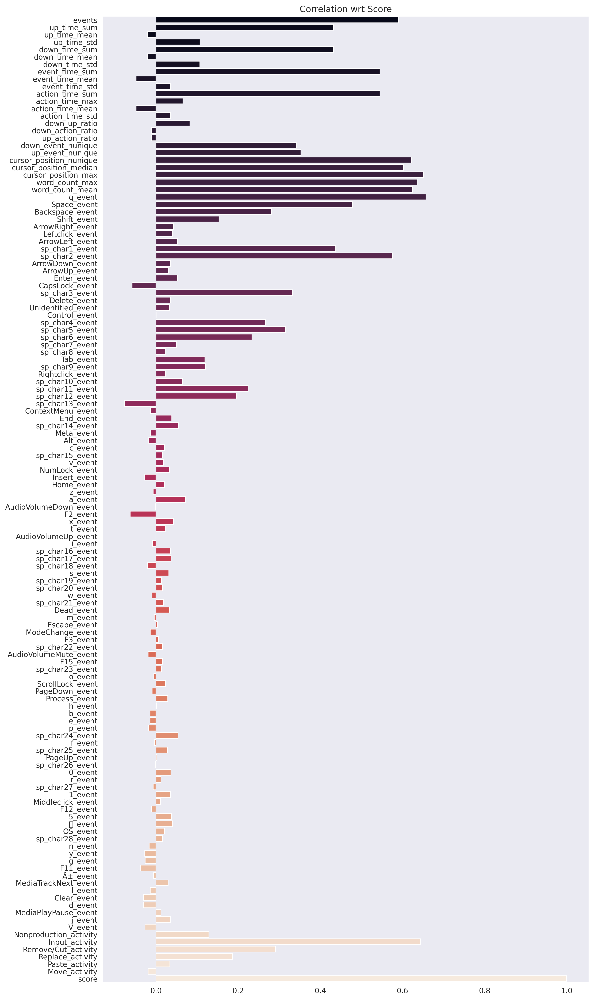

In [22]:
plt.figure(figsize=(12,24),dpi=300)
sns.barplot(train_data.corr()[-1:][:],orient="h",palette="rocket")
plt.title("Correlation wrt Score");

In [23]:
fig,axes = plt.subplots(75,2,figsize=(15,150),dpi=300)

for ind,col in enumerate(train_data.columns[:75]):
    
    plt.subplot(75,2,2*ind+1)
    sns.histplot(train_data,x=col,bins=40,kde=True);
    plt.gca().set_title(col)
        
    plt.subplot(75,2,2*ind+2)
    sns.boxplot(train_data,x=col,orient="h",palette="flare")
    plt.gca().set_title(col)
    
fig.tight_layout()
plt.show()

In [24]:
import sklearn
# sklearn.metrics.get_scorer_names() 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, HistGradientBoostingRegressor
from sklearn.linear_model import SGDRegressor, HuberRegressor, BayesianRidge
from sklearn.metrics import mean_absolute_error, mean_squared_error
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import optuna

seed = np.random.seed(6)

In [25]:
def plotImportance(modelName,model):
    history = pd.DataFrame()
    history["cols"] = X_test.columns
    history["imp"] = model.feature_importances_
    history.sort_values("imp",inplace=True,ascending=False)
    history.reset_index(inplace=True,drop=True)
    plt.figure(figsize=(20,12))
    sns.barplot(x=history["imp"],y=history["cols"],palette="rocket");
    plt.title(f"{modelName} Feature Importance")
    return history

In [26]:
cols = [i for i in train_data.columns if i!="score"]

X = train_data[cols]
y = train_data["score"]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33,random_state=seed)

<div id="4" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
   Baseline Model Training
    </h1>
</div>

### 1. Baseline RF

In [27]:
rfmodel = RandomForestRegressor(random_state=seed)
rfmodel.fit(X_train,y_train)
print("-"*25,"RF Model Baseline","-"*25)
preds = rfmodel.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(rfmodel,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- RF Model Baseline -------------------------
MAE: 0.5234191176470587
MSE: 0.4565876838235294
RMSE: 0.6757127228516046
RMSE CV: 0.6605522424943168


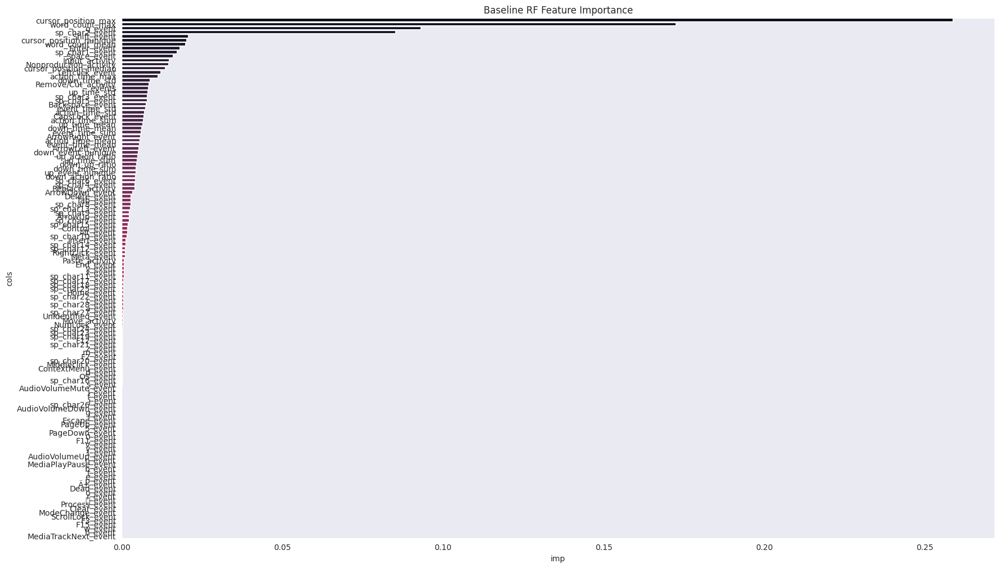

In [28]:
rf_importance = plotImportance("Baseline RF",rfmodel)

### Baseline GB

In [29]:
gbmodel = GradientBoostingRegressor(random_state=seed)
gbmodel.fit(X_train,y_train)
print("-"*25,"GB Model Baseline","-"*25)
preds = gbmodel.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(gbmodel,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- GB Model Baseline -------------------------
MAE: 0.5209216777115533
MSE: 0.44973768498774674
RMSE: 0.6706248466823659
RMSE CV: 0.6581625345168296


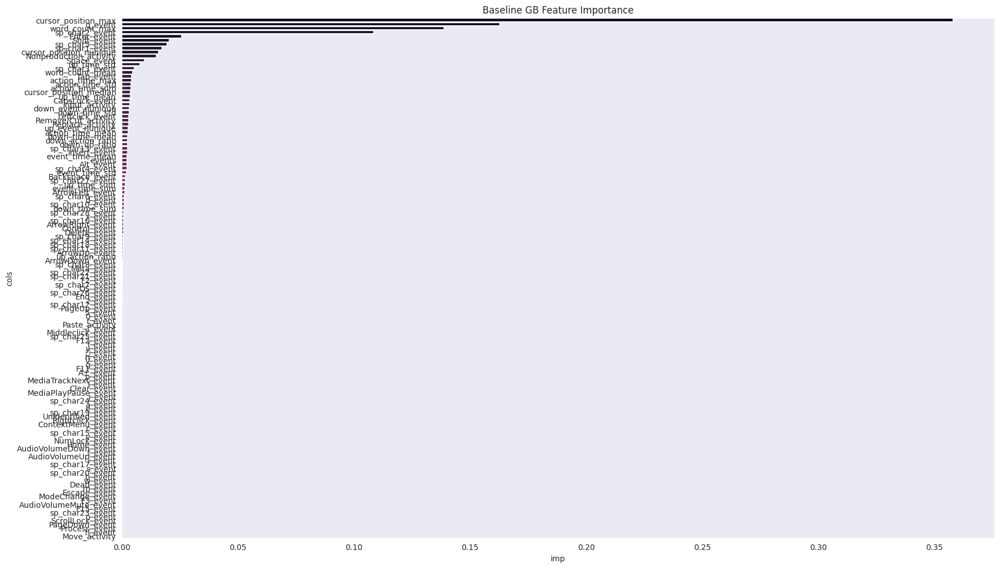

In [30]:
gb_importance = plotImportance("Baseline GB",gbmodel)

### Baseline XGB

In [31]:
xgbmodel = XGBRegressor(n_estimators=4321,random_state=seed,tree_method = "gpu_hist")
xgbmodel.fit(X_train,y_train)
print("-"*25,"XGB Model Baseline","-"*25)
preds = xgbmodel.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(xgbmodel,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- XGB Model Baseline -------------------------
MAE: 0.5535310420627687
MSE: 0.5043678224425385
RMSE: 0.7101885823093318
RMSE CV: 0.7173647205574905


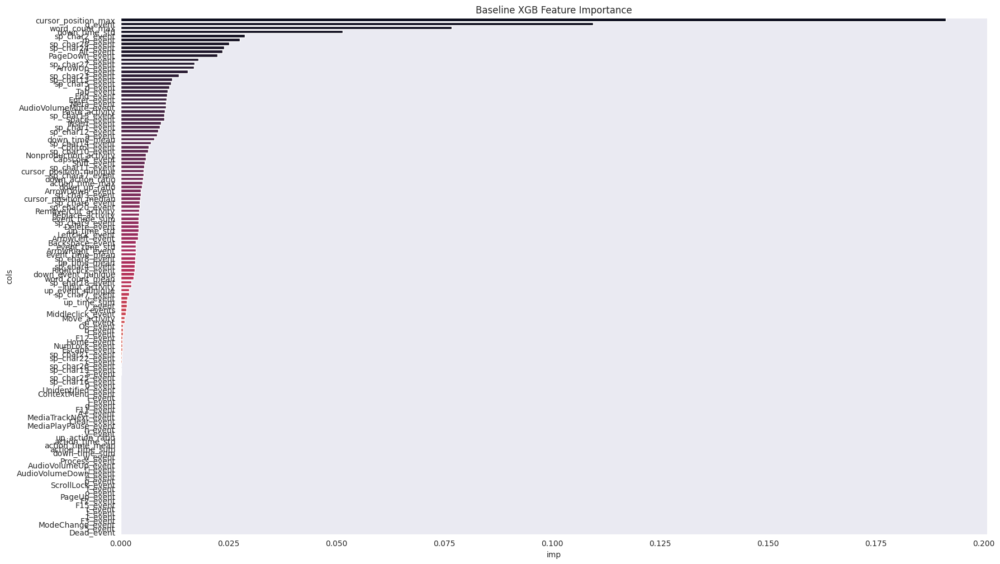

In [32]:
xgb_importance = plotImportance("Baseline XGB",xgbmodel)

### Baseline LGBM

In [33]:
lgbmmodel = LGBMRegressor(random_state=seed,device="gpu", metric= 'rmse')
lgbmmodel.fit(X_train,y_train)
print("-"*25,"LGBM Model Baseline","-"*25)
preds = lgbmmodel.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(lgbmmodel,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- LGBM Model Baseline -------------------------
MAE: 0.527875520154957
MSE: 0.4738393777196422
RMSE: 0.6883599187341185
RMSE CV: 0.665810915657948


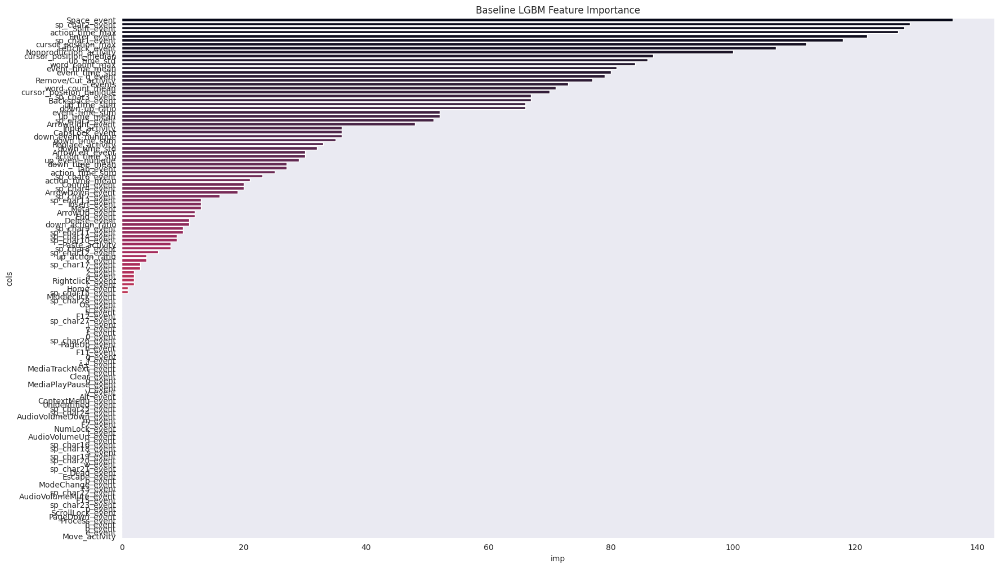

In [34]:
lgbm_importance = plotImportance("Baseline LGBM",lgbmmodel)

### Baseline Voting

In [35]:
vrmodel = VotingRegressor([("rf",rfmodel),("gb",gbmodel),("xgb",xgbmodel),("lgbm",lgbmmodel)])
vrmodel.fit(X_train,y_train)
print("-"*25,"Voting Baseline","-"*25)
preds = vrmodel.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(vrmodel,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- Voting Baseline -------------------------
MAE: 0.5176462765464517
MSE: 0.44290574621033374
RMSE: 0.6655116424303438
RMSE CV: 0.6563593160638539


<div id = "5" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Feature Selection
    </h1>
</div>

In [36]:
rf_importance = rf_importance[:50]["cols"]
gb_importance = gb_importance[:50]["cols"]
xgb_importance = xgb_importance[:50]["cols"]
lgbm_importance = lgbm_importance[:50]["cols"]

In [37]:
final_columns = []
for i in X.columns:
    score = 0
    if i in rf_importance.to_list():
        score+=1
    if i in gb_importance.to_list():
        score+=1
    if i in xgb_importance.to_list():
        score+=1
    if i in lgbm_importance.to_list():
        score+=1
    if score>=3:
        final_columns.append(i)
print(final_columns)

['events', 'up_time_sum', 'up_time_mean', 'up_time_std', 'down_time_sum', 'down_time_mean', 'down_time_std', 'event_time_sum', 'event_time_mean', 'event_time_std', 'action_time_sum', 'action_time_max', 'action_time_mean', 'action_time_std', 'down_up_ratio', 'down_action_ratio', 'down_event_nunique', 'up_event_nunique', 'cursor_position_nunique', 'cursor_position_median', 'cursor_position_max', 'word_count_max', 'word_count_mean', 'q_event', 'Space_event', 'Backspace_event', 'Shift_event', 'Leftclick_event', 'ArrowLeft_event', 'sp_char1_event', 'sp_char2_event', 'ArrowDown_event', 'ArrowUp_event', 'Enter_event', 'CapsLock_event', 'sp_char3_event', 'sp_char4_event', 'sp_char5_event', 'sp_char6_event', 'Tab_event', 'sp_char13_event', 'Insert_event', 'Nonproduction_activity', 'Input_activity', 'Remove/Cut_activity', 'Replace_activity']


<div id="6" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Optuna Tuning
</div>

In [38]:
X = train_data[final_columns]
y = train_data["score"]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.33,random_state=seed)

test_data = test_data[final_columns]

### Opt LGBM

In [39]:
# def objective(trial):
#     params = {
#         'n_estimators' : trial.suggest_int('n_estimators',500,10000),
#         "max_depth":trial.suggest_int('max_depth',3,100),
#         "learning_rate" : trial.suggest_float('learning_rate',1e-4, 0.25, log=True),
#         "min_child_weight" : trial.suggest_float('min_child_weight', 0.5,4),
#         "min_child_samples" : trial.suggest_int('min_child_samples',1,250),
#         "subsample" : trial.suggest_float('subsample', 0.2, 1),
#         "subsample_freq" : trial.suggest_int('subsample_freq',0,5),
#         "colsample_bytree" : trial.suggest_float('colsample_bytree',0.2,1),
#         'num_leaves' : trial.suggest_int('num_leaves', 2, 128),
#     }
#     lgbmmodel_optuna = LGBMRegressor(**params,random_state=seed,device="gpu")
#     cv = -1*cross_val_score(lgbmmodel_optuna, X, y, cv = 4,scoring='neg_root_mean_squared_error').mean()
#     return cv

# study = optuna.create_study(direction='minimize')
# study.optimize(objective, n_trials=100,timeout=5000)

In [40]:
# Hyperparameter tuned using Optuna 0.648640106283897
params_lgbm = {'n_estimators': 1140, 'max_depth': 3, 'learning_rate': 0.012192985298639868,
               'min_child_weight': 2.5028737839599557, 'min_child_samples': 40,
               'subsample': 0.5833615591152317, 'subsample_freq': 1, 'colsample_bytree': 0.7342387857363913}

lgbm_opt = LGBMRegressor(**params_lgbm,random_state=seed,device="gpu")
lgbm_opt.fit(X_train,y_train)

LGBMRegressor(colsample_bytree=0.7342387857363913, device='gpu',
              learning_rate=0.012192985298639868, max_depth=3,
              min_child_samples=40, min_child_weight=2.5028737839599557,
              n_estimators=1140, subsample=0.5833615591152317,
              subsample_freq=1)

In [41]:
print("-"*25,"LGBM Model Optuna","-"*25)
preds = lgbm_opt.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(lgbm_opt,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- LGBM Model Optuna -------------------------
MAE: 0.488986580854381
MSE: 0.4103278952511385
RMSE: 0.6405684157458424
RMSE CV: 0.6445689111498187


### Opt XGB

In [42]:
# def objective(trial):
#     params = {
#     'n_estimators' : trial.suggest_int('n_estimators',500,2000),
#     'max_depth':  trial.suggest_int('max_depth',3,8),
#     'min_child_weight': trial.suggest_float('min_child_weight', 2,4),
#     "learning_rate" : trial.suggest_float('learning_rate',1e-4, 0.2),
#     'subsample': trial.suggest_float('subsample', 0.2, 1),
#     'gamma': trial.suggest_float("gamma", 1e-4, 1.0),
#     "colsample_bytree" : trial.suggest_float('colsample_bytree',0.2,1),
#     "colsample_bylevel" : trial.suggest_float('colsample_bylevel',0.2,1),
#     "colsample_bynode" : trial.suggest_float('colsample_bynode',0.2,1),
#     }
    
#     xgbmodel_optuna = XGBRegressor(**params,random_state=seed,tree_method = "gpu_hist")
#     xgbmodel_optuna.fit(X,y)
#     cv = -1*cross_val_score(xgbmodel_optuna, X, y, cv = 4,scoring='neg_root_mean_squared_error').mean()
#     return cv

# study = optuna.create_study(direction='minimize')
# study.optimize(objective, n_trials=100,timeout=5000)

In [43]:
# Hyperparameter tuned using Optuna 0.6469217862169994
params_xgb = {'n_estimators': 786, 'max_depth': 7, 'min_child_weight': 2.039057805276082,
              'learning_rate': 0.014416140789003485, 'subsample': 0.4709832796447838,
              'gamma': 0.944842834910575, 'colsample_bytree': 0.3665662093440971,
              'colsample_bylevel': 0.5005441850291041, 'colsample_bynode': 0.5984372995917981}

xgb_opt = XGBRegressor(**params_xgb,random_state=seed,tree_method = "gpu_hist")
xgb_opt.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=0.5005441850291041,
             colsample_bynode=0.5984372995917981,
             colsample_bytree=0.3665662093440971, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.944842834910575, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.014416140789003485, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=2.039057805276082, missing=nan,
             monotone_constraints=None, n_estimators=786, n_jobs=None,
             num_parallel_tree=None, predictor=None, random_state=None, ...)

In [44]:
print("-"*25,"XGB Model Optuna","-"*25)
preds = xgb_opt.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(xgb_opt,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- XGB Model Optuna -------------------------
MAE: 0.4896438768973537
MSE: 0.4127378285677786
RMSE: 0.6424467515427085
RMSE CV: 0.647405380586888


### Opt Voting Regressor

In [48]:
vr_opt = VotingRegressor([("xgb",xgb_opt),("lgbm",lgbm_opt)],weights=[0.3,0.7])
vr_opt.fit(X_train,y_train)
print("-"*25,"Voting Optuna","-"*25)
preds = vr_opt.predict(X_test)
print("MAE:",mean_absolute_error(y_test,preds))
print("MSE:",mean_squared_error(y_test,preds))
print("RMSE:",mean_squared_error(y_test,preds,squared=False))
print("RMSE CV:",-1*cross_val_score(vr_opt,X,y,cv=4,scoring='neg_root_mean_squared_error').mean())

------------------------- Voting Optuna -------------------------
MAE: 0.4872294056357352
MSE: 0.40776693754542737
RMSE: 0.6385663141330173
RMSE CV: 0.6432788827005302


<div id = "7" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Creating 'submission.csv'
</div>

In [46]:
vr_opt.fit(X,y)

submission = pd.DataFrame()
submission["id"] = test_data.index
submission["score"] = vr_opt.predict(test_data)

submission.to_csv("submission.csv",index=False,header=True)

submission.head()

,id,score
0,0000aaaa,1.069193
1,2222bbbb,1.084349
2,4444cccc,1.099677


<div id = "8" style="background-color: #F2E5E5; padding: 20px; border-radius: 20px; border: 2px solid black;">
    <h1 style="font-family:  'Garamond', 'Lucida Sans', sans-serif; text-align: center; color: #2B3A55; font-weight: bold; font-size: 42px;">
    Conclusion
    <h3 style="font-family: 'Lucida Sans', 'Lucida Sans', sans-serif; text-align: center; color: #CE7777; line-height: 1.6;">
    If you found the notebook helpful, please Upvote the Notebook😊<br>
If you have any suggestion, feel free to Comment & Tag me
    </h3>
</div>

